In [1]:
%load_ext autoreload

%autoreload 2

In [2]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

In [2]:
import math
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow, imread, imsave, figure
import pandas as pd
import numpy as np
import os
import sys
from skimage.color import rgb2gray
from skimage.transform import rescale, resize


#Keras:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import LearningRateScheduler
from keras.optimizers import SGD
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler

#Custom Functions:
ROOT_DIR = os.path.abspath("../")
sys.path.append(ROOT_DIR)

from imports.utils.log_progress import log_progress
from imports.utils.visualization import Visualize
from imports.utils.enums import DATA_BASE_PATH, SHAPE
from imports.models.u_net import get_unet
from imports.utils.utils import rle_encode, rle_decode

DATA_IMAGE_PATH = DATA_BASE_PATH + '/Images'
DATA_MASK_PATH = DATA_BASE_PATH + '/Masks'

Using TensorFlow backend.


In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

['/job:localhost/replica:0/task:0/device:GPU:0']

### load Model:

In [5]:
from imports.models.losses import bce_dice_loss, dice_coeff, iou
from keras.models import load_model, model_from_json
from segmentation_models.losses import bce_jaccard_loss, dice_loss
from segmentation_models.metrics import iou_score

import keras.losses
keras.losses.custom_loss = bce_dice_loss

model = load_model('../saved_models/unet/inceptionv3_unet/new_model.h5', custom_objects={'bce_dice_loss': bce_dice_loss,'dice_coeff':dice_coeff,'iou':iou,"bce_jaccard_loss":bce_jaccard_loss})

# 2. Visualize

### 2.1 Show Samples of trained Model:

In [15]:
train_df = pd.read_pickle(DATA_BASE_PATH+'/train_df')
val_df = pd.read_pickle(DATA_BASE_PATH+'/val_df')
test_df = pd.read_pickle(DATA_BASE_PATH+'/test_df')

print("Number of training Samples:", len(train_df))
print("Number of validation Samples:", len(val_df))
print("Number of test Samples:", len(test_df))

Number of training Samples: 354
Number of validation Samples: 102
Number of test Samples: 51


In [9]:
imgs = os.listdir(DATA_BASE_PATH+"/03_test/images")
files = {"image_path":DATA_BASE_PATH+"/03_test/images/",
         "name":imgs}
test_field_df = pd.DataFrame.from_dict(files)
test_field_df.sample(1)

,image_path,name
7,../data/03_test/images/,IMG_20190406_165334.jpg


### Validation Set:

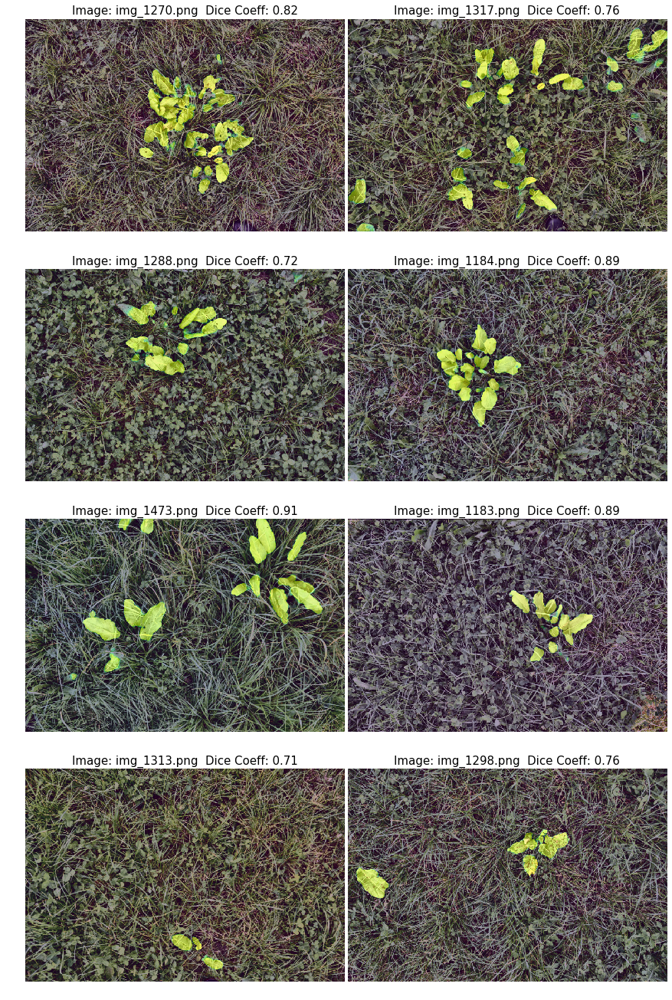

In [25]:
vis_params = {'df':val_df,
              'input_shape':(512,768,3),
              'pred_layer':1,
              'model':model}

visualize = Visualize(**vis_params)
visualize.show_matrix("random","image_prediction",rows=4)

### Test Set:

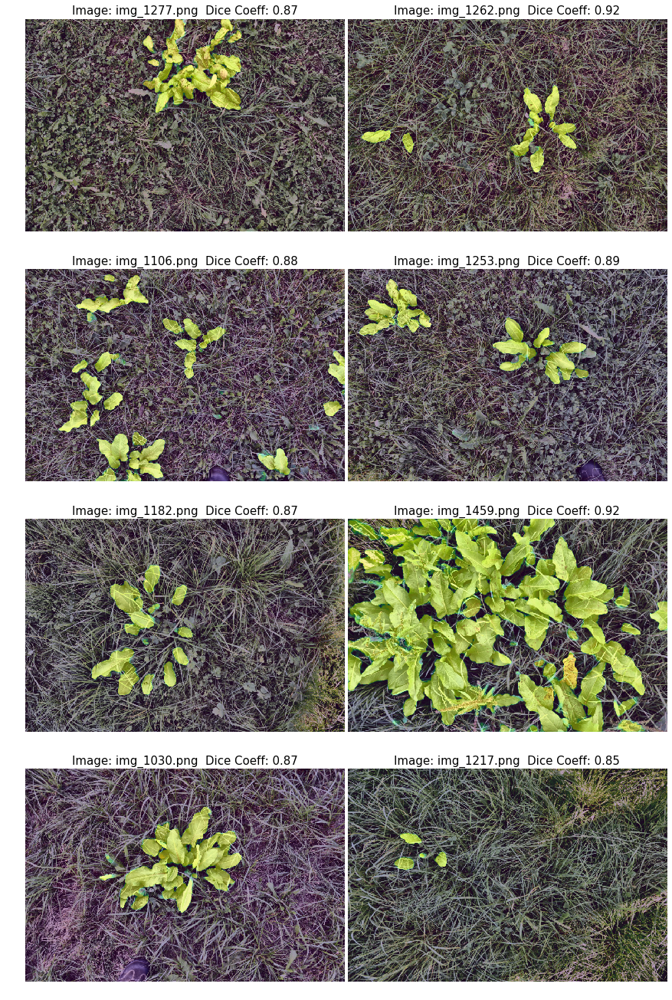

In [13]:
vis_params = {'df':test_df,
              'input_shape':(512,768,3),
              'pred_layer':1,
              'model':model}

visualize = Visualize(**vis_params)
visualize.show_matrix("random",mode="image_prediction",rows=4)

### New Testset
Testphotos von Wiese vor Büro

In [33]:
imgs = os.listdir(DATA_BASE_PATH+"/02_test/images")
files = {"image_path":DATA_BASE_PATH+"/02_test/images/",
         "name":imgs}
test_field_df = pd.DataFrame.from_dict(files)
test_field_df.sample(2)

,image_path,name
26,../data/02_test/images/,P1170126.JPG
66,../data/02_test/images/,IMG_20190324_155232.jpg


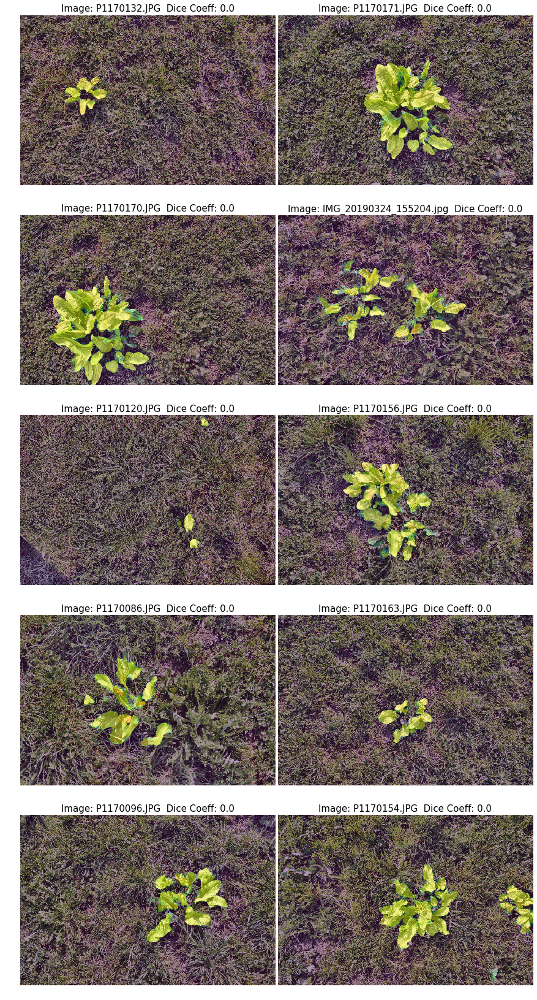

In [34]:
vis_params = {'df':test_field_df,
              'input_shape':(512,768,3),
              'pred_layer':1,
              'model':model}

visualize = Visualize(**vis_params)
visualize.show_matrix("random",mode="image_prediction",rows=5)

### Segment the predicted Masks using watershed-segmentation:

In [29]:
vis_params = {'df':val_df,
              'input_shape':(512,768,3),
              'pred_layer':1,
              'model':model}
visualize = Visualize(**vis_params)

im = visualize.get_image("1114")
pred = visualize.get_prediction("1114")

Text(0.5,1,'Separated objects')

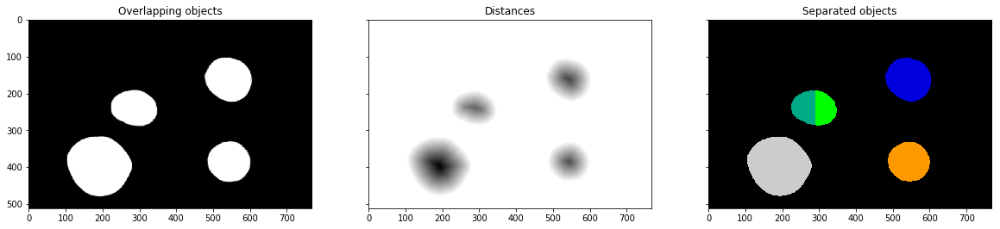

In [26]:
# http://scikit-image.org/docs/dev/auto_examples/segmentation/plot_watershed.html

def watershed_segmentation(prediction_image,threshold=0.90,footprint_size=(40,40)):
    from scipy import ndimage as ndi
    from skimage.morphology import watershed
    from skimage.feature import peak_local_max
    from skimage.draw import circle
    circle_img = np.zeros(footprint_size, dtype=np.uint8)
    rr, cc = circle(footprint_size[0]/2, footprint_size[1]/2,min(footprint_size)/2-2)
    circle_img[rr, cc] = 1
    
    # Now we want to separate the two objects in image
    # Generate the markers as local maxima of the distance to the background
    pred_logical = prediction_image>threshold
    distance = ndi.distance_transform_edt(pred_logical)
    local_maxi = peak_local_max(distance, indices=False, footprint=circle_img, labels=pred_logical)
    markers = ndi.label(local_maxi)[0]
    labels = watershed(-distance, markers, mask=pred_logical)
    
    return distance, labels, local_maxi

distance, labels, local_maxi = watershed_segmentation(pred,footprint_size=(30,30))

fig, axes = plt.subplots(ncols=3, figsize=(20, 20), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(pred, cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title('Overlapping objects')
ax[1].imshow(-distance, cmap=plt.cm.gray, interpolation='nearest')
ax[1].set_title('Distances')
ax[2].imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[2].set_title('Separated objects')

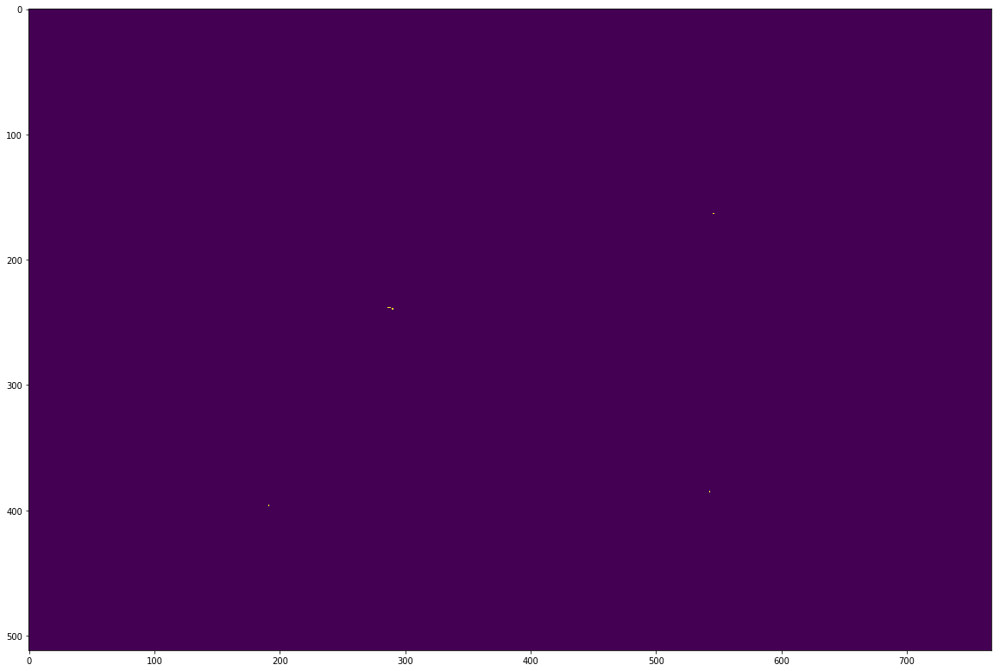

In [21]:
plt.figure(figsize=(20,20))
imshow(local_maxi)

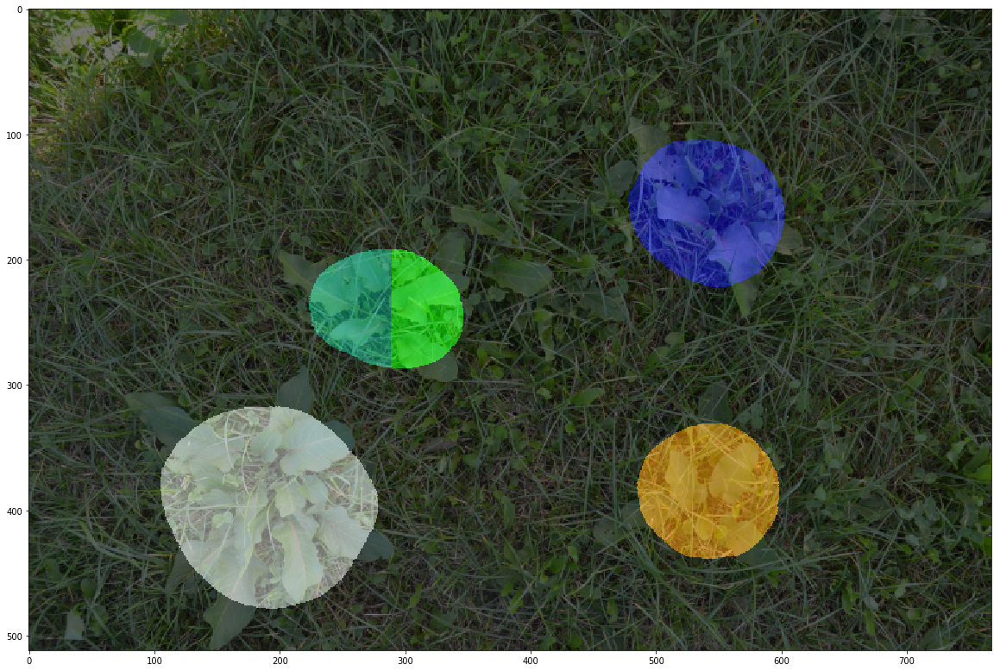

In [22]:
plt.figure(figsize=(20,20))
imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest')
imshow(im,alpha=0.5)

In [82]:
vis_params = {'df':test_field_df,
              'input_shape':(512,768,3),
              'pred_layer':2,
              'model':model}

visualize1 = Visualize(**vis_params)

vis_params = {'df':test_field_df,
              'input_shape':(512,768,3),
              'pred_layer':1,
              'model':model}

visualize2 = Visualize(**vis_params)

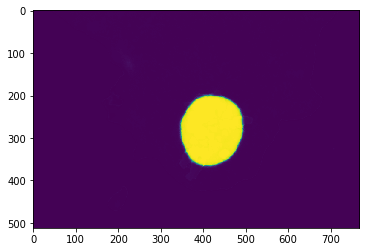

In [155]:
index = "P1170056"
pred = visualize1.get_prediction(index=index)
pred2 = visualize2.get_prediction(index=index)
img = visualize1.get_image(index=index)
imshow(pred)

In [156]:
import skimage.measure
mask = pred > 0.3
labels = skimage.measure.label(mask)
print(labels.shape, labels.dtype)
print("Unique values in labels:", np.unique(labels))

(512, 768) int64
Unique values in labels: [0 1]


In [157]:
import ipywidgets as widgets
@widgets.interact(label = list(np.unique(labels)))
def f(label):
    print(f"The connected component with label {label} contains {np.sum(labels == label)} pixels")
    plt.imshow(labels == label)

interactive(children=(Dropdown(description='label', options=(0, 1), value=0), Output()), _dom_classes=('widget…

In [158]:
regions = skimage.measure.regionprops(labels)
large_regions = [r for r in regions if r.area > 2000]
print(f"There are {len(large_regions)} large regions")

There are 1 large regions


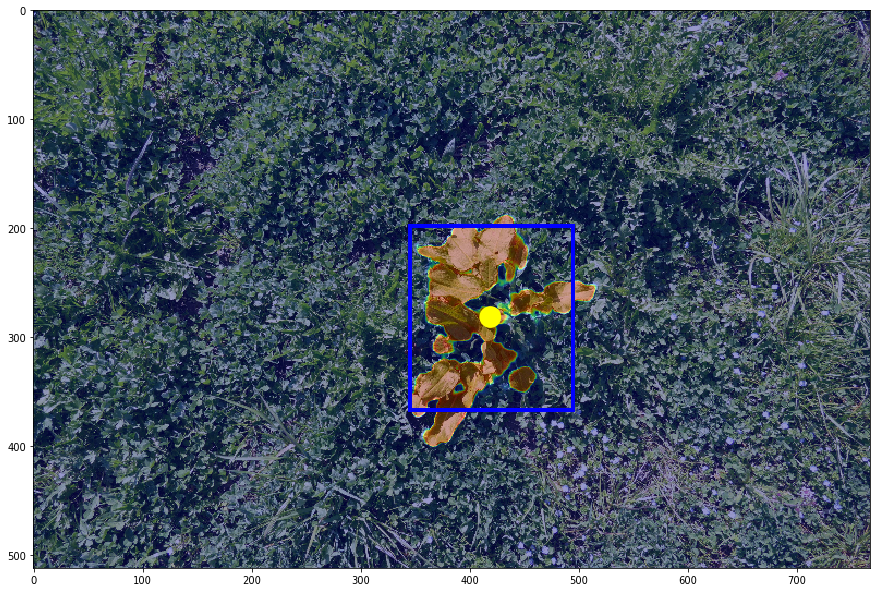

In [159]:
import matplotlib.patches as patches
fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(img, cmap="gray")
ax.imshow(pred2,cmap='jet',alpha=0.4)
rects = []
circs = []
for r in large_regions:
    (min_row, min_col, max_row, max_col) = r.bbox
    (c_row,c_col) = r.centroid
    width = max_col - min_col
    height = max_row - min_row
    rect = patches.Rectangle((min_col,min_row),width,height,
                            linewidth=4,edgecolor='b',facecolor='None')
    circ = patches.Circle((c_col,c_row),10,facecolor='yellow')
    ax.add_patch(rect)
    ax.add_patch(circ)
    rects.append(rect)
    circs.append(circ)

#### Eigenvector Test:

In [37]:
#Eigenvector Test:
tmp = pred>0.9
y, x = np.nonzero(tmp)
x = x - np.mean(x)
y = y - np.mean(y)
coords = np.vstack([x, y])
cov = np.cov(coords)
evals, evecs = np.linalg.eig(cov)
sort_indices = np.argsort(evals)[::-1]
x_v1, y_v1 = evecs[:, sort_indices[0]]  # Eigenvector with largest eigenvalue
x_v2, y_v2 = evecs[:, sort_indices[1]]


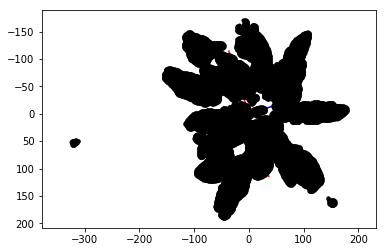

In [38]:
scale = 60
plt.plot([x_v1*-scale*2, x_v1*scale*2],
         [y_v1*-scale*2, y_v1*scale*2], color='red')
plt.plot([x_v2*-scale, x_v2*scale],
         [y_v2*-scale, y_v2*scale], color='blue')
plt.plot(x, y, 'k.')
plt.axis('equal')
plt.gca().invert_yaxis()  # Match the image system with origin at top left
plt.show()